In [ ]:
!pip install embree
!pip install rtree
!pip install shapely
!pip install trimesh
!pip install numpy
!pip install scipy
!pip install open3d
!pip install pyglet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.9/18.9 MB 50.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 12.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.0/681.0 kB 8.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 420.5/420.5 MB 3.6 MB

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.0/841.0 kB 11.8 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import open3d as o3d
import trimesh
import os
import numpy as np
import scipy
import matplotlib.pyplot as plt
import copy
import pyglet

# Trimesh based visualizer 

In [ ]:
def visualizer(root, mesh_name):
    
    if 'list' in str(type(mesh_name)):
        scene = trimesh.scene.Scene()
        for name in mesh_name:
            mesh_path = os.path.join(root,name)
            mesh = trimesh.load(mesh_path, process=False, prefer_colors='vertex')
            scene.add_geometry(mesh)
        return scene
    
    mesh_path = os.path.join(root,mesh_name)
    mesh = trimesh.load(mesh_path, process=False)
    scene = trimesh.scene.Scene()
    scene.add_geometry(mesh)
    return scene

# Download the required data
Download the data directory and save it in your Google drive.
In the next cell, make sure to enter your drive/local appropriate location of the data to access the data present.
If time permits or as an exercise, you can also try the following experiments on the point clouds or meshes of your own choice.

## IO operations

In [ ]:
src = 'drive/MyDrive/3DVSS/data/'
dest = 'drive/MyDrive/3DVSS/output/'
os.makedirs(dest, exist_ok=True)

# Point Cloud

In [ ]:
# read point cloud
filename = 'bunny_small.ply'
pcd = o3d.io.read_point_cloud(os.path.join(src, filename))

# write point cloud
save_name = 'bunny_new.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name), pcd)
print(len(np.asarray(pcd.points)))
# scene = visualizer(dest, save_name)
# scene.show()

453


In [ ]:
# visualize
pcd = trimesh.load(os.path.join(src, filename))

trans_pcd_away = trimesh.transformations.translation_matrix(np.array([0.0, 0.0, -4.0])) # Move mesh away origin
pcd.apply_transform(trans_pcd_away)

scene = trimesh.scene.Scene()# create scene

# angle = 90
# rotate_pcd = trimesh.transformations.rotation_matrix(angle=np.radians(angle), direction=[0,0,1]) # Rotate mesh accoring to rotation parameter
# pcd.apply_transform(rotate_pcd)


scene.camera_transform = np.eye(4) # camera at origin
scene.camera.fov = [3,3]

"""Camera Visualization"""
scene.camera.resolution = [10,10] # to limit the number of rays

origin, vector, pixels = scene.camera_rays()
ray_vis = trimesh.load_path(np.hstack((origin, origin + vector*2.0)).reshape(-1, 2, 3))

num_entities = len(ray_vis.entities)
ray_vis.colors = np.array(num_entities*[255,0,0,120]).reshape(-1,4)
"""Camera Visualization Ends"""

scene.camera.resolution = [1000,1000] # reset the camera resolution

scene.add_geometry(pcd) # add mesh to the scene
scene.add_geometry(ray_vis) # add camera rays to the scene
scene.show()

# Triangle Mesh

In [ ]:
# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))

# write triangle mesh
save_name = 'airplane_new.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh)

# # visualize
# scene = visualizer(dest, save_name)
# scene.show()

True

In [ ]:
# visualize
mesh = trimesh.load(os.path.join(src, filename))

trans_mesh_away = trimesh.transformations.translation_matrix(np.array([0.0, 0.0, -4.0])) # Move mesh away origin
mesh.apply_transform(trans_mesh_away)

scene = trimesh.scene.Scene()# create scene

angle = 90
rotate_mesh = trimesh.transformations.rotation_matrix(angle=np.radians(angle), direction=[0,0,1]) # Rotate mesh accoring to rotation parameter
mesh.apply_transform(rotate_mesh)


scene.camera_transform = np.eye(4) # camera at origin
scene.camera.fov = [60,60]

"""Camera Visualization"""
scene.camera.resolution = [10,10] # to limit the number of rays

origin, vector, pixels = scene.camera_rays()
ray_vis = trimesh.load_path(np.hstack((origin, origin + vector*2.0)).reshape(-1, 2, 3))

num_entities = len(ray_vis.entities)
ray_vis.colors = np.array(num_entities*[255,255,0,120]).reshape(-1,4)
"""Camera Visualization Ends"""

scene.camera.resolution = [1920,1080] # reset the camera resolution

scene.add_geometry(mesh) # add mesh to the scene
scene.add_geometry(ray_vis) # add camera rays to the scene
scene.show()

## Understanding Point Cloud

In [ ]:
# read point cloud
filename = 'bunny_small.ply'
pcd = o3d.io.read_point_cloud(os.path.join(src, filename))

# access informaton using numpy
points = np.asarray(pcd.points)
colors = np.asarray(pcd.colors)
normals = np.asarray(pcd.normals)

# Understanding Triangle Mesh

In [ ]:
# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))

# access informaton using numpy
vertices = np.asarray(mesh.vertices)
faces = np.asarray(mesh.triangles)
colors = np.asarray(mesh.vertex_colors)
normals = np.asarray(mesh.vertex_normals)

# Transformations

## Rotation


In [ ]:
# random rotation
R = scipy.spatial.transform.Rotation.random(1)
R = R.as_matrix()
R = np.array(R).reshape(3,3)

# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))
mesh_rot = mesh.rotate(R)
mesh.paint_uniform_color([1,0,0])

# write triangle mesh
save_name = 'mesh_rotated.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh_rot)

# visualize
scene = visualizer(dest, [save_name,'airplane_new.obj'])
scene.show()

## Translation


In [ ]:
# random translation
T = np.random.uniform(1000,1000,(3,))

# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))
mesh_translated = mesh.translate(T)
mesh.paint_uniform_color([1,0,0])

# write triangle mesh
save_name = 'mesh_translated.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh_translated)

# visualize
scene = visualizer(dest, [save_name,'airplane_new.obj'])
scene.show()

## Scale

In [ ]:
# scaling paramter
S = 2.0
center = np.array([0,0,0])

# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))
mesh_scaled = mesh.scale(S, center)
mesh.paint_uniform_color([1,0,0])

# write triangle mesh
save_name = 'mesh_scaled.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh_scaled)

# visualize
scene = visualizer(dest, [save_name,'airplane_new.obj'])
scene.show()

## Transformation Matrix

In [ ]:
# random rotation
R = scipy.spatial.transform.Rotation.random(1)
R = R.as_matrix()
R = np.array(R).reshape(3,3)

# random translation
T = np.random.uniform(-500,500,(3,))

# scaling factor
scale = 2.0

In [ ]:
# create transformation matrices
RT = np.eye(4)
RT[:3,:3] = R
RT[:3,3] = T

S = np.eye(4)
S[:3,:3] = scale*np.eye(3)

# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))

# apply transformations
mesh.transform(S)
mesh.transform(RT)

# assign different color
mesh.paint_uniform_color([1,0,0])

# write triangle mesh
save_name = 'mesh_transformed.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh)

# visualize
scene = visualizer(dest, [save_name,'airplane_new.obj'])
scene.show()

## Different order of transformations

In [ ]:
# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))
# apply transformations
mesh.transform(S)
mesh.transform(RT)
# assign different color
mesh.paint_uniform_color([1,0.5,0])
# write triangle mesh
save_name_1 = 'mesh_transformed_1.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name_1), mesh)


# read triangle mesh
filename = 'airplane.obj'
mesh = o3d.io.read_triangle_mesh(os.path.join(src, filename))
# apply transformations (different order)
mesh.transform(RT)
mesh.transform(S)
# assign different color
mesh.paint_uniform_color([0.3,1,0])
# write triangle mesh
save_name_2 = 'mesh_transformed_2.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name_2), mesh)

# visualize
scene = visualizer(dest, [save_name_1, save_name_2, 'airplane_new.obj'])
scene.show()

# Working with RGB-D data

In [ ]:
# data loading
redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
color_raw = o3d.io.read_image(redwood_rgbd.color_paths[0])
depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[0])

# create RGBD image ( 3 + 1 = 4 channels )
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)

print("Color info : ",rgbd.color)
print()
print("Depth info : ",rgbd.depth)

[Open3D INFO] Downloading https://github.com/isl-org/open3d_downloads/releases/download/20220301-data/SampleRedwoodRGBDImages.zip
[Open3D INFO] Downloaded to /root/open3d_data/download/SampleRedwoodRGBDImages/SampleRedwoodRGBDImages.zip
[Open3D INFO] Created directory /root/open3d_data/extract/SampleRedwoodRGBDImages.
[Open3D INFO] Extracting /root/open3d_data/download/SampleRedwoodRGBDImages/SampleRedwoodRGBDImages.zip.
[Open3D INFO] Extracted to /root/open3d_data/extract/SampleRedwoodRGBDImages.
Color info :  Image of size 640x480, with 3 channels.
Use numpy.asarray to access buffer data.

Depth info :  Image of size 640x480, with 1 channels.
Use numpy.asarray to access buffer data.


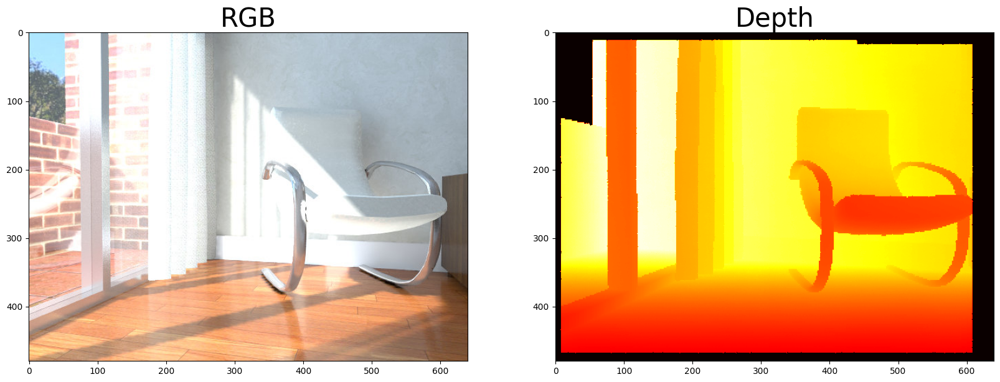

In [ ]:
# plot
fig, ax = plt.subplots(nrows=1, ncols=2)
fig.set_size_inches(20,40)
ax[0].imshow(rgbd.color)
ax[0].set_title('RGB',size=30)
ax[1].imshow(rgbd.depth,cmap='hot')
ax[1].set_title('Depth',size=30)
plt.show()

# Point Cloud from RGBD

In [ ]:
# Camera intrinsics
cam_intrinsics =  o3d.camera.PinholeCameraIntrinsic(
        o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault)

cam_intrinsics.intrinsic_matrix

array([[525. ,   0. , 319.5],
       [  0. , 525. , 239.5],
       [  0. ,   0. ,   1. ]])

In [ ]:
# point cloud from RGBD
pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, cam_intrinsics)

# Flip it, otherwise the pointcloud will be upside down
pcd.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])

# write point cloud
save_name = 'pcd_from_rgbd.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name), pcd)

# visualize
scene = visualizer(dest, [save_name])
scene.show()

# Point Cloud Registration

In [ ]:
# Camera intrinsics
cam_intrinsics =  o3d.camera.PinholeCameraIntrinsic(
        o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault)

# data loading (source)
redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
color_raw = o3d.io.read_image(redwood_rgbd.color_paths[1])
depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[1])
# create RGBD image ( 3 + 1 = 4 channels )
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)
# point cloud from RGBD
pcd_source = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, cam_intrinsics)

# data loading (target)
redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
color_raw = o3d.io.read_image(redwood_rgbd.color_paths[2])
depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[2])
# create RGBD image ( 3 + 1 = 4 channels )
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)
# point cloud from RGBD
pcd_target = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, cam_intrinsics)

In [ ]:
# write point clouds
save_name_source = 'pcd_source.ply'
save_name_target = 'pcd_target.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source), pcd_source)
o3d.io.write_point_cloud(os.path.join(dest, save_name_target), pcd_target)

# visualize
scene = visualizer(dest, [save_name_source, save_name_target])
scene.show()

In [ ]:
pcd_source_temp = copy.deepcopy(pcd_source)
pcd_target_temp = copy.deepcopy(pcd_target)

pcd_source_temp.paint_uniform_color([1.0, 0.8, 0.4]) # --> Blue
pcd_target_temp.paint_uniform_color([0.4,0.8,1.0]) # --> Orange

# write point clouds
save_name_source_temp = 'pcd_source_temp.ply'
save_name_target_temp = 'pcd_target_temp.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source_temp), pcd_source_temp)
o3d.io.write_point_cloud(os.path.join(dest, save_name_target_temp), pcd_target_temp)

# visualize
scene = visualizer(dest, [save_name_source_temp, save_name_target_temp])
scene.show()

#### Exercise : Random Transformation

Construct a random RT matrix (no scaling) and apply it to the Source Point Cloud.

In [ ]:
# random rotation
R = scipy.spatial.transform.Rotation.random(1)
R = R.as_matrix()
R = np.array(R).reshape(3,3)

# random translation
T = np.random.uniform(-1,1,(3,))

# create transformation matrices
RT = np.eye(4)
RT[:3,:3] = R
RT[:3,3] = T

# apply RT to pcd_source
pcd_source.transform(RT)

# write transformed point cloud
save_name_source = 'pcd_source.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source), pcd_source)

# visualize
scene = visualizer(dest, [save_name_source, save_name_target])
scene.show()

#### Global Registration

In [ ]:
def preprocess_point_cloud(pcd, voxel_size):
    print(":: Downsample with a voxel size %.3f." % voxel_size)
    pcd_down = pcd.voxel_down_sample(voxel_size)

    radius_normal = voxel_size * 2
    print(":: Estimate normal with search radius %.3f." % radius_normal)
    pcd_down.estimate_normals(
        o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))

    radius_feature = voxel_size * 5
    print(":: Compute FPFH feature with search radius %.3f." % radius_feature)
    pcd_fpfh = o3d.pipelines.registration.compute_fpfh_feature(
        pcd_down,
        o3d.geometry.KDTreeSearchParamHybrid(radius=radius_feature, max_nn=100))
    return pcd_down, pcd_fpfh

voxel_size = 0.05
source_down, source_fpfh = preprocess_point_cloud(pcd_source, voxel_size)
target_down, target_fpfh = preprocess_point_cloud(pcd_target, voxel_size)

:: Downsample with a voxel size 0.050.
:: Estimate normal with search radius 0.100.
:: Compute FPFH feature with search radius 0.250.
:: Downsample with a voxel size 0.050.
:: Estimate normal with search radius 0.100.
:: Compute FPFH feature with search radius 0.250.


In [ ]:
distance_threshold = voxel_size*1.5
result = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
        source_down, target_down, source_fpfh, target_fpfh, True,
        distance_threshold,
        o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
        3, [
            o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(
                0.9),
            o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(
                distance_threshold)
        ], o3d.pipelines.registration.RANSACConvergenceCriteria(100000, 0.999))

RT_global = result.transformation
RT_global

array([[ 0.15279858, -0.33303817,  0.93045052, -0.25690699],
       [ 0.56816092, -0.74075126, -0.35844209, -0.11221959],
       [ 0.8086073 ,  0.58341507,  0.07603353,  0.57788481],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [ ]:
# apply RT_golbal to pcd_source
pcd_source_temp = copy.deepcopy(pcd_source)
pcd_source_temp.transform(RT_global)

# write transformed point cloud
save_name_source_temp = 'pcd_source_transformed.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source_temp), pcd_source_temp)

# visualize
scene = visualizer(dest, [save_name_source_temp, save_name_target])
scene.show()

#### Local Refinement (ICP)

Point-to-Point ICP

In [ ]:
threshold = 0.1
p2p_icp = o3d.pipelines.registration.registration_icp(
    pcd_source, pcd_target, threshold, RT_global,
    o3d.pipelines.registration.TransformationEstimationPointToPoint(),
    o3d.pipelines.registration.ICPConvergenceCriteria(max_iteration=30))

In [ ]:
RT_refined = p2p_icp.transformation
RT_refined

array([[ 0.11682809, -0.35485541,  0.92759303, -0.1986922 ],
       [ 0.57673777, -0.73612646, -0.35424763, -0.12124883],
       [ 0.80853246,  0.57636401,  0.11865827,  0.54333846],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [ ]:
# apply RT_golbal to pcd_source
pcd_source_temp = copy.deepcopy(pcd_source)
pcd_source_temp.transform(RT_refined)

# write transformed point cloud
save_name_source_temp = 'pcd_source_transformed.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source_temp), pcd_source_temp)

# visualize
scene = visualizer(dest, [save_name_source_temp, save_name_target])
scene.show()

Point-to-Plane ICP

In [ ]:
threshold = 0.1
pcd_target.estimate_normals()
p2plane_icp = o3d.pipelines.registration.registration_icp(
    pcd_source, pcd_target, threshold, RT_global,
    o3d.pipelines.registration.TransformationEstimationPointToPlane(),
    o3d.pipelines.registration.ICPConvergenceCriteria(max_iteration=30))

RT_refined = p2plane_icp.transformation
RT_refined

array([[ 0.11648209, -0.35373412,  0.9280647 , -0.19665418],
       [ 0.57800827, -0.73574086, -0.35297567, -0.12193179],
       [ 0.80767466,  0.57754442,  0.11876062,  0.542581  ],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [ ]:
# apply RT_golbal to pcd_source
pcd_source_temp = copy.deepcopy(pcd_source)
pcd_source_temp.transform(RT_refined)

# write transformed point cloud
save_name_source_temp = 'pcd_source_transformed.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source_temp), pcd_source_temp)

# visualize
scene = visualizer(dest, [save_name_source_temp, save_name_target])
scene.show()

# TSDF Integration

In [ ]:
# Camera intrinsics
cam_intrinsics =  o3d.camera.PinholeCameraIntrinsic(
        o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault)

rgbd_images = []
intrinsic_data = []
transforms = []
for i in range(2):
    redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
    color_raw = o3d.io.read_image(redwood_rgbd.color_paths[i])
    depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[i])
    rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)
    rgbd_images.append(rgbd)
    intrinsic_data.append(cam_intrinsics)
    transforms.append(np.eye(4))

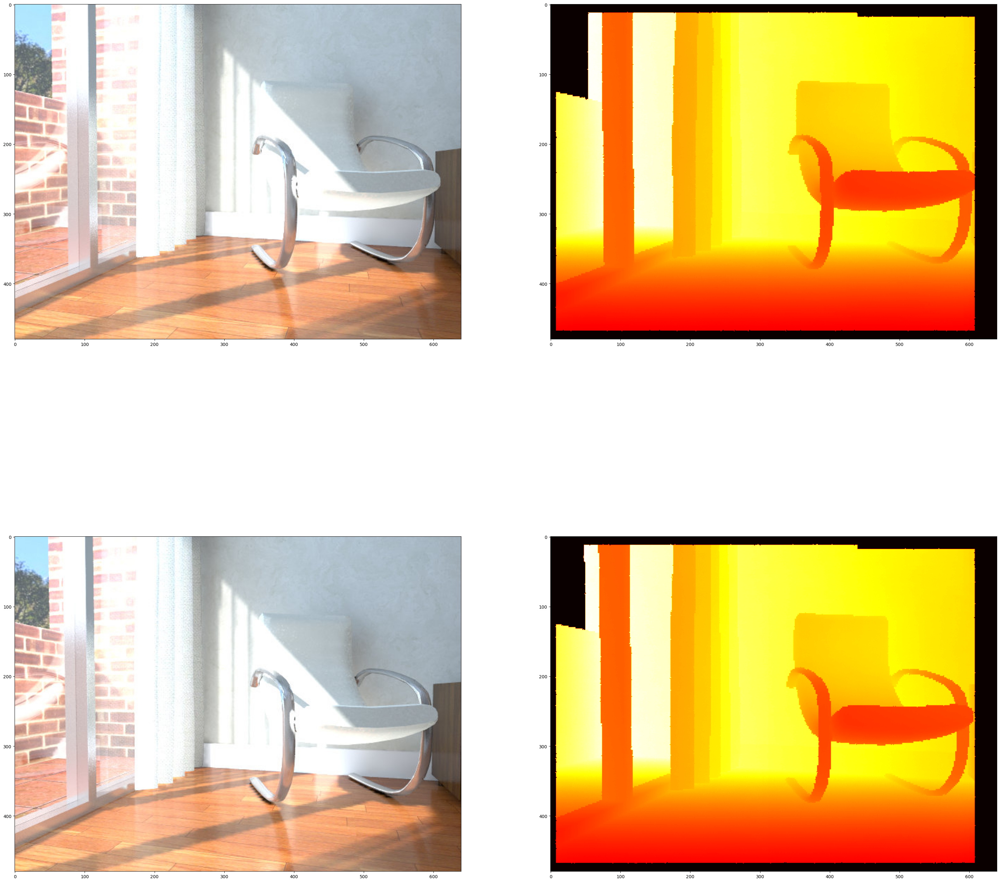

In [ ]:
# plot
fig, ax = plt.subplots(nrows=2, ncols=2)
fig.set_size_inches(40,40)
ax[0,0].imshow(rgbd_images[0].color)
ax[0,1].imshow(rgbd_images[0].depth,cmap='hot')
ax[1,0].imshow(rgbd_images[1].color)
ax[1,1].imshow(rgbd_images[1].depth,cmap='hot')
plt.show()

In [ ]:
volume = o3d.pipelines.integration.ScalableTSDFVolume(
    voxel_length=0.008,
    sdf_trunc=0.04,
    color_type=o3d.pipelines.integration.TSDFVolumeColorType.RGB8,
    volume_unit_resolution=64,
    depth_sampling_stride=1)

for i in range(2):
    volume.integrate(rgbd_images[i], intrinsic_data[i], transforms[i])
    
mesh = volume.extract_triangle_mesh()

# write tsdf mesh
save_name = 'tsdf_mesh.ply'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh)

# visualize
scene = visualizer(dest, [save_name])
scene.show()